# Etude des préfixes exprimant le haut degré dans JSI Web Corpus (2014-2019)

liste des préfixes : ultra-, super-, supra-, hyper-, hypra-, sur-, extra-, méga-, giga-, archi-, maxi-

Dans ce travail, nous étudions les formations à un mot


In [1]:
import requests
import sys, csv,re, random, glob,os
import numpy as np                               # vectors and matrices
import pandas as pd                              # tables and data manipulations
import matplotlib.pyplot as plt

import matplotlib.pylab as plt
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6
import matplotlib
import seaborn as sns                            # more plots
from sklearn.metrics import mean_absolute_error
from matplotlib.backends.backend_pdf import PdfPages

# chargement des fonctions

In [2]:
## functions
# load yearly corpus stats (total words)
# compare with google stats per year
def load_total_counts(corpus_id, start_year, end_year):
    '''
    This function loads the total counts for a given corpus from Google's source data.
    '''
    # map from id to url
    id_to_url= {
    15: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-eng-all-totalcounts-20120701.txt',
    17: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-eng-us-all-totalcounts-20120701.txt',
    18: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-eng-gb-all-totalcounts-20120701.txt',
    16: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-eng-fiction-all-totalcounts-20120701.txt',
    23: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-chi-sim-all-totalcounts-20120701.txt',
    19: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-fre-all-totalcounts-20120701.txt',
    20: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-ger-all-totalcounts-20120701.txt',
    24: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-heb-all-totalcounts-20120701.txt',
    22: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-ita-all-totalcounts-20120701.txt',
    25: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-rus-all-totalcounts-20120701.txt',
    21: 'http://storage.googleapis.com/books/ngrams/books/googlebooks-spa-all-totalcounts-20120701.txt'
    }
    hdr='Mozilla/5.0 (Macintosh; Intel Mac OS X x.y; rv:10.0) Gecko/20100101 Firefox/10.0'
    headers={'User-Agent':hdr}
    resp = requests.get(id_to_url[corpus_id],headers=headers)
    resp.raise_for_status()
    response = resp.text
    #print(response)
    #response = urllib2.urlopen(urllib2.Request(id_to_url[corpus_id]))
    #total_counts = []
    total_counts2 = {}
    data = response.split("\t")
    for row in data:
        #print (row)
        #continue
        # first and last rows are empty, so a try...except is needed
        try:
            year, word_count, _, _ = row.split(',')
            #print(start_year)
            #print(end_year)
            #print(year)
            if int(year) >= start_year and int(year) <= end_year:
                #print(year)
                #print(word_count)
                #total_counts.append(int(word_count))
                total_counts2[year]=int(word_count)
                #print(total_counts)
        except ValueError:
            pass
        
    return total_counts2


def plot_rolling_simple(df,title, window=10):
    fig, ax = plt.subplots(2,figsize=(20, 10))
    ax[0].plot(df.index, df.data, label='raw data')
    ax[0].plot(df.data.rolling(window=window).mean(), label="rolling mean (window=" + str(window) + ")")
    ax[0].plot(df.data.rolling(window=window).std(), label="rolling std (window=" + str(window) + ")")
    ax[0].legend()

    ax[1].plot(df.index, df.z_data, label="de-trended data")
    ax[1].plot(df.z_data.rolling(window=window).mean(), label="rolling mean (window=" + str(window) + ")")
    ax[1].plot(df.z_data.rolling(window=window).std(), label="rolling std (window=" + str(window) + ")")
    ax[1].legend()

    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    #fig.autofmt_xdate()
    
# useful for annotating barcharts
def add_value_labels(ax, spacing=5):
    """Add labels to the end of each bar in a bar chart.

    Arguments:
        ax (matplotlib.axes.Axes): The matplotlib object containing the axes
            of the plot to annotate.
        spacing (int): The distance between the labels and the bars.
    """

    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


            
            
# save dataframe df
# save to excel
def save_report(df, key, outfile):
    """
    Take a report and save it to a single Excel file
    """
    cols = sorted(list(df.columns.values),reverse=True)
    #print(cols)
    writer = pd.ExcelWriter(outfile)
    #for k, grp in df[['prefix','word','full_count','string']].groupby(key):
    for pref in dist1.index.values:
        dfprint = df[df.prefix == pref].groupby(['word','string','sep'])['full_count'].sum().reset_index().sort_values('full_count', ascending=False).set_index(['word'])
        #print(dfprint)
        dfprint.to_excel(writer,pref)
        #grp.sort_values('full_count', ascending=False).set_index(['string','word','sep'])['full_count'].to_excel(writer,k)
    writer.save()
    return True


# Chargement dico

In [3]:
# load dico with pos tags
def load_dico(fn='./dico_fr_pos/morfetik.xml'):
    dico2={}
    dico={}
    pos={}
    posref={'D:Déf': 'DET', 'D:Ind':  'DET', 'P:Ind':  'DET', 'D:Rel':  'DET', 'P:Int': 'PRON', 'P:Rel': 'PRON', 'P:Dém': 'PRON', 
            'D:Dém':  'DET', 
            'D:Num':  'DET', 'D:Part':  'DET', 'P:Pers': 'PRON', 'D:Poss':  'DET', 'P:Poss':  'PRON', 'D:Excl':  'DET', 'D:Inte':  'DET', 
            'Verbe': 'VERB', 'adj': 'ADJ', 'adjm': 'ADJ','adj(f)': 'ADJ', 'adjf': 'ADJ', 'adj(m)': 'ADJ', 'adjms': 'ADJ', 'adjord': 'ADJ', 
            'adjfp': 'ADJ', 'adjfs': 'ADJ', 'nm': 'NOM', 'nms': 'NOM', 
            'nf': 'NOM', 'nmp': 'NOM', 'nfs': 'NOM', 'nfp': 'NOM', 'Prép': 'PREP', 'Adv': 'ADV', 'Interj': 'INTERJ', 'C:Sub': 'CONJ', 
            'C:Coord': 'CONJ'}

    with open(fn,encoding='utf8', mode='r') as f:
        for line in f:
            res = re.search(r"forme=\"([^\"]+)\".+? catgram=\"([^\"]+)\"",line.strip(),re.I) # r'forme=.(\w+). .+? catgram=.(\w+)\"'
            if res:
                dico[res.group(1)] = posref[res.group(2)]
                #print(res.group(1), res.group(2))
                if res.group(1) in dico2.keys():
                    data = dico2[res.group(1)]
                    data.append(posref[res.group(2)])
                    dico2[res.group(1)] = data
                else:
                    dico2[res.group(1)] = [posref[res.group(2)]]
                pos[res.group(2)] = pos.get(res.group(2),0)+1
            else:
                print("no match for line : " + line)
    return (dico,dico2,pos)


dico,dico2,pos = load_dico()
print(len(dico))
print(pos)


no match for line : </dico>
557400
{'D:Déf': 11, 'D:Ind': 48, 'P:Ind': 25, 'D:Rel': 10, 'P:Int': 15, 'P:Rel': 16, 'P:Dém': 14, 'D:Dém': 5, 'D:Num': 29, 'D:Part': 5, 'P:Pers': 33, 'D:Poss': 24, 'P:Poss': 24, 'D:Excl': 4, 'D:Inte': 4, 'Verbe': 519349, 'adj': 95710, 'adjm': 544, 'adj(f)': 120, 'adjf': 202, 'adj(m)': 306, 'adjms': 3, 'adjord': 132, 'adjfp': 1, 'adjfs': 1, 'nm': 68021, 'nms': 995, 'nf': 69057, 'nmp': 160, 'nfs': 215, 'nfp': 152, 'Prép': 61, 'Adv': 1899, 'Interj': 201, 'C:Sub': 14, 'C:Coord': 9}


# Chargement des stoplists

In [4]:
stoplist={}
stoplist_loc={}
files = glob.glob("./stoplists/*.txt")
for file in files:
    with open(file, mode="r",encoding="utf8") as f:
        if re.search(r'stoplist_latinloc', file):
            for line in f:
                if len(line.strip())>0:
                    stoplist_loc[line.strip()]=1
        else:
            for line in f:
                if len(line.strip())>0:
                    stoplist[line.strip()]=1
            
print("Stoplist chargée : " + str(len(stoplist)) + " mots.")
print("Stoplist Loc chargée : " + str(len(stoplist_loc)) + " mots.")

Stoplist chargée : 4174 mots.
Stoplist Loc chargée : 890 mots.


# chargement données générales

In [321]:

if os.path.isfile('../TimsstampedJSIWebCorpus/prefixes_JSIWC_2014-201.csv'):
    print("Loading ../TimsstampedJSIWebCorpus/prefixes_JSIWC_2014-201.csv")
    df= pd.read_csv('../TimsstampedJSIWebCorpus/prefixes_JSIWC_2014-201.csv', header=0, sep='\t', error_bad_lines=False)#, index_col=0 
else:
    print("../TimsstampedJSIWebCorpus/prefixes_JSIWC_2014-201.csv does not exist")
    exit()

# élimination stoplist
#df = df[~df.string.isin(stoplist)]
df.set_index('préfixe', inplace=True)

df.info()
df.head()


Loading ../TimsstampedJSIWebCorpus/prefixes_JSIWC_2014-201.csv
<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, hyper to super
Data columns (total 3 columns):
nb_unique    9 non-null int64
nb_total     9 non-null int64
nb_freq1     9 non-null int64
dtypes: int64(3)
memory usage: 288.0+ bytes


,nb_unique,nb_total,nb_freq1
préfixe,,,
hyper,6294,128343,3332
archi,1959,335786,1252
hypra,36,105,32
méga,2414,84841,1354
maxi,890,359524,561


# Informations générales

In [327]:
pdf2 = PdfPages('./JSIWC_general.pdf')


# distribution entre les prefixes
fig, ax = plt.subplots(1,2, figsize=(20, 15))
df.sort_values('nb_unique', ascending=False)[['nb_unique','nb_freq1']].plot(rot=45, kind="bar",ax=ax[0], title="Nombre de formes uniques / fréquence 1")
add_value_labels(ax[0])
df.sort_values('nb_total', ascending=False)['nb_total'].plot(rot=45, kind="bar",ax=ax[1], title="Nombre d'occurences totales")
add_value_labels(ax[1])
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()
pdf2.savefig()
plt.close()
pdf2.close()

# chargement données détaillées

In [120]:
import re, glob
files = glob.glob('../TimsstampedJSIWebCorpus/*.csv')
#print(str(len(files)) +  " files to parse")
dfs = []
for fn in files:
    #print("parsing " + fn)
    df= pd.read_csv(fn, sep=',', header=None,  error_bad_lines=True)#, index_col=0 
    #print(df.info())
    #print(len(df))
    dfs.append(df)

df = pd.concat(dfs,ignore_index=True)
df.columns=['string','freq'] # names=['word','freq'], dtype={'word':object,'freq':'Int64'},
df = df[~df.string.isin(['corpus','subcorpus','word','lc'])]
df = df[~df.string.isin(stoplist)]
df.info()
df.sort_values("freq", ascending=False).head()




<class 'pandas.core.frame.DataFrame'>
Int64Index: 29763 entries, 3 to 30593
Data columns (total 2 columns):
string    29763 non-null object
freq      29763 non-null object
dtypes: object(2)
memory usage: 697.6+ KB


,string,freq
2940,extra-territorialité,99
23542,ultra-dominante,99
23540,ultra-limitée,99
23541,ultra-compacte,99
1094,archicomble,983


In [122]:
pref_re = '^(ultra|super|sur|hyper|hypra|extra|méga|archi|maxi|supra)(?:-)?(?:.*)?$'
sep_re = '^(?:ultra|super|sur|hyper|hypra|extra|méga|archi|maxi|supra)(-)?(?:.*)?$'
word_re = '^(?:ultra|super|sur|hyper|hypra|extra|méga|archi|maxi|supra)(?:-)?(.*)?$'
df['prefix'] = df.string.str.extract(pref_re, expand=True)
df['word'] = df.string.str.extract(word_re, expand=True)
df['sep'] = df.string.str.extract(sep_re, expand=True)
df.fillna('', inplace=True)
print(df.info())
print(df.head())
df['freq']= df['freq'].astype('int64')
#df['freq'] = df.transform(lambda x : int(x.freq))
#df['freq'] = int(df.freq.any())
print(df.info())
print(df.sort_values("freq", ascending=False).head())



<class 'pandas.core.frame.DataFrame'>
Int64Index: 29763 entries, 3 to 30593
Data columns (total 5 columns):
string    29763 non-null object
freq      29763 non-null object
prefix    29763 non-null object
word      29763 non-null object
sep       29763 non-null object
dtypes: object(5)
memory usage: 1.4+ MB
None
              string freq prefix         word sep
3      archi-ciblées    1  archi      ciblées   -
4    archi-fluctuant    1  archi    fluctuant   -
5       archi-locaux    1  archi       locaux   -
6  archi-accrocheurs    1  archi  accrocheurs   -
7       archi-vilain    1  archi       vilain   -
<class 'pandas.core.frame.DataFrame'>
Int64Index: 29763 entries, 3 to 30593
Data columns (total 5 columns):
string    29763 non-null object
freq      29763 non-null int64
prefix    29763 non-null object
word      29763 non-null object
sep       29763 non-null object
dtypes: int64(1), object(4)
memory usage: 1.4+ MB
None
               string    freq prefix       word sep
2814   extrao

        count     sum  freq1      prod
prefix                                
ultra    7211  183078   3479  0.482457
super    7185  245096   3992  0.555602
hyper    6236  123419   3315  0.531591
sur      2502   25291   1379  0.551159
méga     2291   53885   1289  0.562636
extra    1837  214826    972  0.529124
archi    1660   13635   1041  0.627108
maxi      805   10214    545  0.677019
hypra      36     105     32  0.888889


TypeError: 'AxesSubplot' object does not support indexing

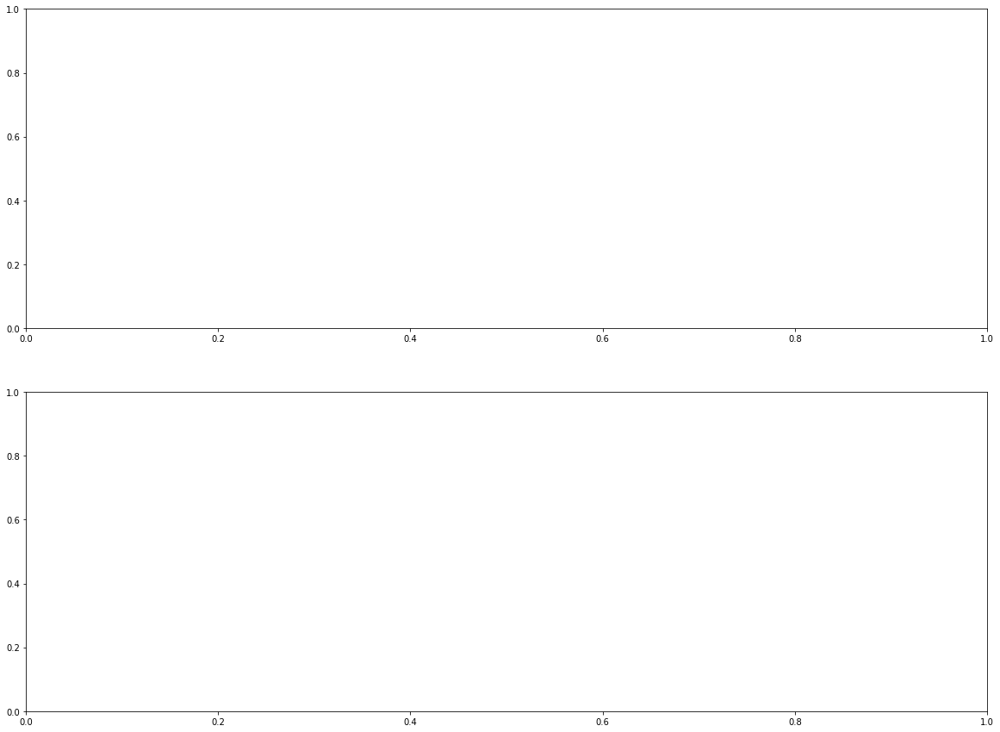

In [154]:
# calcul productivité
def freq1(x):
    #print(x)
    return len(x[x==1])
df2 = df.groupby(['prefix'])['freq'].agg(['count','sum',freq1]).sort_values('count', ascending=False)

df2['prod'] = df2['freq1'] / df2['count']
print(df2)
fig, ax = plt.subplots(2,1, figsize=(20, 15))
df2[['count','freq1']].plot(kind="bar", ax=ax[0][0], rot=45, title="Nombre de formations distinctes",legend=True)
add_value_labels(ax[0][0])
df2[['sum']].plot(kind="bar",ax=ax[0][1], rot=45, title="Nombre total d'occurrences")
add_value_labels(ax[0][1])
#df2[['freq1']].plot(kind="bar",ax=ax[0][0], rot=45, title="Nombre de formations de fréquence 1")
#df2[['prod']].plot(kind="bar",ax=ax[1][1], rot=45, title="Taux de fréquence 1 / nombre total")


In [153]:
# df3 bu prefix - string

df3 = df.groupby(['prefix','string'])['freq'].agg(['count','sum']).sort_values('count', ascending=False)
print(df3.head())
print(df[df.string=='ultratrain'])

                         count  sum
prefix string                      
ultra  ultrapro              2    5
       ultra-optimisées      2    3
       ultra-relaxant        2    3
       ultranature           2    3
       ultratrain            2    7
           string  freq prefix   word sep
27612  ultratrain     1  ultra  train    
30353  ultratrain     6  ultra  train    


In [ ]:
# distribution plots

# distribution plots
fig, ax = plt.subplots(8,3, figsize=(20, 15))
# get 0.9 quantile
i = 0
for pref in df2.index.values:
        dfplot = df[df.prefix == pref]
        sns.distplot(dfplot['freq'], ax=ax[i][0]).set_title('{} : {} formes distinctes, {} total occurrences (100%)'.format(pref, df.loc[pref,'count'], dist1.loc[pref,'sum']))
        # get 0.95 quantile
        q = dfplot["full_count"].quantile(0.9)
        dfplot2 = dfplot[dfplot["full_count"] < q]['full_count']      
        sns.distplot(dfplot2, ax=ax[i][1]).set_title(pref + ' : 90% quantiles')
        #sns.distplot(np.log(dfplot), ax=ax[0])
        sns.boxplot(dfplot2,ax=ax[i][2]).set_title(pref + ' : 90% quantiles')
        i=i+1
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()
pdf2.savefig()
plt.close()

In [278]:
# base for browsing prefixes
dist1 = dfpos4.groupby('prefix')['full_count'].agg(['count','sum']).sort_values('count', ascending=False)
print(dist1)
print(dist1.index.values)
print(dist1.loc['maxi','count'])


        count       sum
prefix                 
extra    1434  686278.0
ultra     888  477210.0
super     684  884915.0
hyper     474  424367.0
archi     193  633733.0
supra     170   99975.0
méga      105  106718.0
maxi       15    1583.0
['extra' 'ultra' 'super' 'hyper' 'archi' 'supra' 'méga' 'maxi']
15


### génération csv pour visualisation Néoveille

In [279]:
# for visualization of results
print(dfpos4_rel.columns)
periods = [elt for elt in columns if re.match("[0-9]{4}", elt)]
df5 =  dfpos4_rel.copy(deep=True)
df5tmp = df5[periods]
df5tmp2 = df5[['string','prefix','word','sep','pos']]
#print(df5tmp.info())
#print(df5tmp2.info())

df6 = df5tmp.merge(df5tmp2, right_index = True, left_index = True)
#print(df6.head())
df7 = df6.melt(id_vars = ['string','prefix','word','sep','pos'], value_name = "rel_freq").dropna()
df7.rename(index=str, columns={"variable": "year"}, inplace=True)
df7 = df7[df7.rel_freq > 0]
print(df7.info())
print(df7.head())
df7.to_csv("df_googlengrams_neoveille.csv", index=False)

Index(['1800', '1801', '1802', '1803', '1804', '1805', '1806', '1807', '1808',
       '1809',
       ...
       'full_count', 'pos', 'posGNG', 'prefix', 'sep', 'string', 'string1',
       'string2', 'string3', 'word'],
      dtype='object', length=220)
<class 'pandas.core.frame.DataFrame'>
Index: 206683 entries, 7 to 832220
Data columns (total 7 columns):
string      206683 non-null object
prefix      206683 non-null object
word        206683 non-null object
sep         206683 non-null object
pos         206683 non-null object
year        206683 non-null object
rel_freq    206683 non-null float64
dtypes: float64(1), object(6)
memory usage: 12.6+ MB
None
         string prefix    word     sep  pos  year  rel_freq
7   archicomble  archi  comble  FUSION  NOM  1800  0.000021
21     archiduc  archi     duc  FUSION  NOM  1800  0.000021
23     archiduc  archi     duc  FUSION  NOM  1800  0.000021
24     archiduc  archi     duc  FUSION  NOM  1800  0.005307
25     archiduc  archi     duc  FUSION

### data synthesis

In [280]:
prefs = df7.prefix.unique()
#dist1 = dfpos4.groupby(['prefix','sep','pos'])['full_count'].agg(['count','sum'])#.sort_values('count', ascending=False)
#dist2 = dfpos4.groupby(['prefix','sep','pos'])['full_count'].agg(['count','sum'])#.sort_values('count', ascending=False)
print(dist1.loc['maxi','count'])
df8 = df7
df8.year.replace({r"^([0-9]{3})([0-9])$":  r'\1\\0', "\\\\":""}, regex=True, inplace=True)
print(df8.year.unique())
    
pdf = PdfPages('synthese_prefixes_googlengrams.pdf')

fig, ax = plt.subplots(8,2, figsize=(30, 50))
# get 0.9 quantile
i = 0
for pref in prefs:
   # df7pivot = df7[df7.prefix == pref].pivot_table("year", "pos", aggfunc=lambda x: len(x.unique()))
    df8pivot = df8[df8.prefix == pref].groupby(['year','pos'])['rel_freq'].mean().unstack()
    sns.heatmap(df8pivot,ax=ax[i][0],  annot=True, fmt="g").set_title(pref + " : Année * POS\nMoyenne de la fréquence relative")#, fmt="d", , annot=True,  title=pref, , linewidths=.5 ,cmap="Blues"
    #plt.show()
    df8pivot = df8[df8.prefix == pref].groupby(['year','sep'])['rel_freq'].mean().unstack()
    sns.heatmap(df8pivot, ax=ax[i][1],annot=True).set_title(pref + " : Année * SEP\nMoyenne de la fréquence relative")#, fmt="d", , annot=True,  title=pref, , linewidths=.5, , fmt=""
    #plt.show()
    i=i+1
fig.tight_layout()
plt.savefig("synthese_prefixes_googlengrams.png")
pdf.savefig()
plt.close()
pdf.close()

15
['180\\0' '181\\0' '182\\0' '183\\0' '184\\0' '185\\0' '186\\0' '187\\0'
 '188\\0' '189\\0' '190\\0' '191\\0' '192\\0' '193\\0' '194\\0' '195\\0'
 '196\\0' '197\\0' '198\\0' '199\\0' '200\\0']


### sauvegarde par préfixe

In [281]:


#print(df4.head())
save_report(dfpos4, 'prefix','prefixes_allgram_googlengrams1800-2010_freq_abs.xls')
#print(df4.head())
save_report(dfpos4_rel, 'prefix','prefixes_allgram_googlengrams1800-2010_freq_rel.xls')



True

In [282]:
# base for browsing prefixes

In [283]:
dist1 = dfpos4.groupby('prefix')['full_count'].agg(['count','sum']).sort_values('count', ascending=False)
print(dist1)
print(dist1.index.values)
#print(dist1.loc['maxi','count'])


        count       sum
prefix                 
extra    1434  686278.0
ultra     888  477210.0
super     684  884915.0
hyper     474  424367.0
archi     193  633733.0
supra     170   99975.0
méga      105  106718.0
maxi       15    1583.0
['extra' 'ultra' 'super' 'hyper' 'archi' 'supra' 'méga' 'maxi']


### synthèse pdf : './results/Prefix_all_POS_synthesis_' + corpus+ '.pdf'

In [284]:
df = dfpos4.copy(deep=True)
df_rel = dfpos4_rel.copy(deep=True)

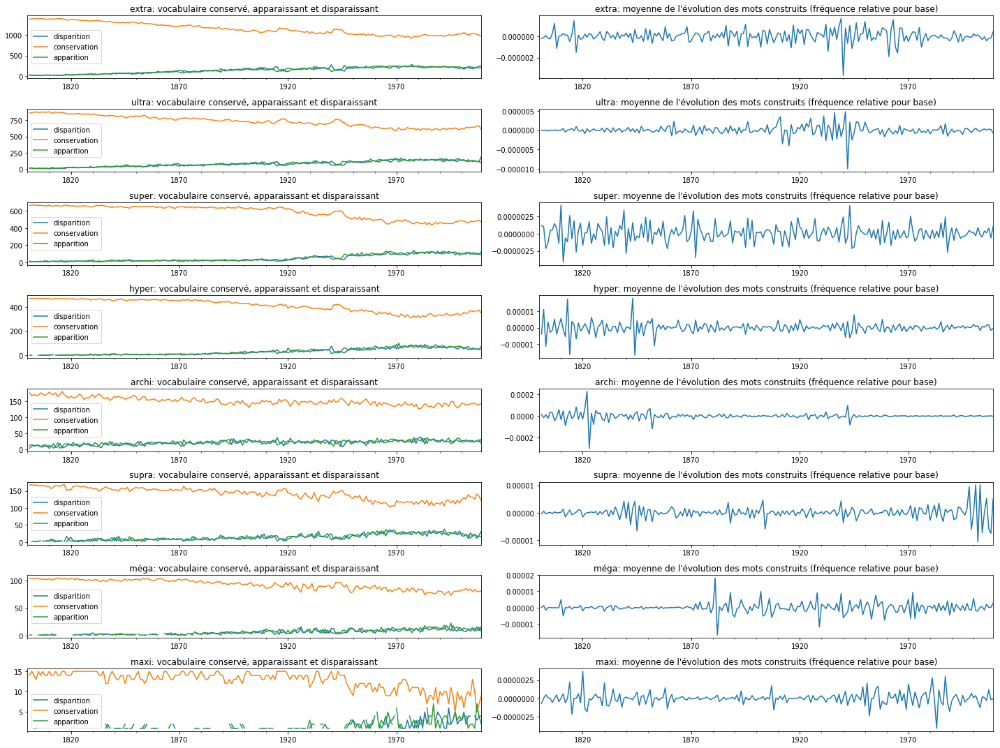

In [300]:
corpus = "googlengrams"
pdf2 = PdfPages('./results/Prefix_all_POS_synthesis_' + corpus+ '.pdf')

#columns = df.columns
#periods = [elt for elt in columns if re.match("[0-9]{4}-[0-9]{2}-[0-9]{2}", elt)]

# distribution entre les prefixes
fig, ax = plt.subplots(3, figsize=(20, 15))
df.groupby('prefix')['full_count'].count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre préfixes (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
add_value_labels(ax[0])
df.groupby('prefix')['full_count'].sum().plot(ax=ax[1],kind="bar",title="Distribution des fréquences entre préfixes (nbre total d'occurrences)", rot=45, figsize=(20,10))  # [['full_count']]
add_value_labels(ax[1])
ax[2].axis("off")
ax[2].table(cellText=dist1.values,
          rowLabels=dist1.index,
          colLabels=dist1.columns,
          cellLoc = 'right', rowLoc = 'center',
          loc='center')
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()

pdf2.savefig()
plt.close()

words = df.groupby('word')['full_count'].agg(['count','sum']).sort_values('sum', ascending=False)
# print(sources)
words20 = list(words.index.values)[0:20]

# distribution entre les mots
fig, ax = plt.subplots(2, figsize=(20, 15))
#df.groupby('source')['full_count'].nlargest(20).count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre sources (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
df[df.word.isin(words20)].groupby('word')['full_count'].count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre mots (20) (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
add_value_labels(ax[0])
df[df.word.isin(words20)].groupby('word')['full_count'].sum().plot(ax=ax[1],kind="bar",title="Distribution des fréquences entre mots (20) (nbre total d'occurrences)", rot=45, figsize=(20,10))  # [['full_count']]
add_value_labels(ax[1])
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()

pdf2.savefig()
plt.close()


# distribution entre les pos
fig, ax = plt.subplots(2, figsize=(20, 15))
df.groupby('pos')['full_count'].count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre pos  (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
add_value_labels(ax[0])
df.groupby('pos')['full_count'].sum().plot(ax=ax[1],kind="bar",title="Distribution des fréquences entre pos  (nbre total d'occurrences)", rot=45, figsize=(20,10))  # [['full_count']]
add_value_labels(ax[1])
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()

pdf2.savefig()
plt.close()

# distribution entre les séparateurs
fig, ax = plt.subplots(2, figsize=(20, 15))
df.groupby('sep')['full_count'].count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre séparateurs  (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
add_value_labels(ax[0])
df.groupby('sep')['full_count'].sum().plot(ax=ax[1],kind="bar",title="Distribution des fréquences entre séparateurs  (nbre total d'occurrences)", rot=45, figsize=(20,10))  # [['full_count']]
add_value_labels(ax[1])
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()

pdf2.savefig()
plt.close()




# distribution plots
fig, ax = plt.subplots(8,3, figsize=(20, 15))
# get 0.9 quantile
i = 0
for pref in dist1.index.values:
        dfplot = df[df.prefix == pref]
        sns.distplot(dfplot['full_count'], ax=ax[i][0]).set_title('{} : {} formes distinctes, {} total occurrences (100%)'.format(pref, dist1.loc[pref,'count'], dist1.loc[pref,'sum']))
        # get 0.95 quantile
        q = dfplot["full_count"].quantile(0.9)
        dfplot2 = dfplot[dfplot["full_count"] < q]['full_count']      
        sns.distplot(dfplot2, ax=ax[i][1]).set_title(pref + ' : 90% quantiles')
        #sns.distplot(np.log(dfplot), ax=ax[0])
        sns.boxplot(dfplot2,ax=ax[i][2]).set_title(pref + ' : 90% quantiles')
        i=i+1
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()
pdf2.savefig()
plt.close()         

fig, ax = plt.subplots(3, figsize=(20, 15))
q = df["full_count"].quantile(0.9)
q2 = df["full_count"].quantile(0.7)
dfplot2 = df[df["full_count"] < q] 
dfplot3 = df[df["full_count"] < q2] 
sns.boxplot(x="prefix", y="full_count", ax=ax[0],data=df).set_title("Boîte à moustache des préfixes (fréquences absolues, 100%)")

sns.boxplot(x="prefix", y="full_count", ax=ax[1], data=dfplot2).set_title("Boîte à moustache des préfixes (fréquences absolues, 90% quantile)")

sns.boxplot(x="prefix", y="full_count", ax=ax[2], data=dfplot3).set_title("Boîte à moustache des préfixes (fréquences absolues, 70% quantile)")
pdf2.savefig()
plt.close()


# evolution globale pour chaque préfixe
dfplot = df.groupby('prefix')[periods].sum().T
dfplot.index = pd.to_datetime(dfplot.index)
dfplot_rel = df_rel.groupby('prefix')[periods].sum().T
# freq absolue
fig, ax = plt.subplots(1, figsize=(20, 15))
dfplot.plot(ax=ax,kind="line", title="Evolution des distributions des préfixes (fréquence absolue, périodisation originelle)", rot=45, figsize=(20,10))  # [['full_count']]    
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
pdf2.savefig()
plt.close()


# freq rel
fig, ax = plt.subplots(1, figsize=(20, 15))
dfplot_rel.plot(ax=ax,kind="line", title="Evolution des distributions des préfixes (fréquence relative)", rot=45, figsize=(20,10))  # [['full_count']]    
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
pdf2.savefig()
plt.close()

# evolution nbre de mots distincts
fig, ax = plt.subplots(1, figsize=(20, 15))

for k,grp in df_rel.groupby(['prefix']):
    #print(k)
    grp[periods].astype(bool).sum(axis=0).T.plot(title=k, legend=True,ax=ax,kind="line", rot=45, figsize=(25,15))  # [['full_count']]
    i=i+1
ax.set_title("Evolution du nombre de formes différentes")
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
pdf2.savefig()
plt.close()





# evolution globale pour chaque mot (20 plus fréquents)
fig, ax = plt.subplots(1, figsize=(20, 15))
dfplot = df[df.word.isin(words20)].groupby('word')[periods].sum().T
dfplot.index = pd.to_datetime(dfplot.index)
dfplot_rel = df_rel[df_rel.word.isin(words20)].groupby('word')[periods].sum().T
dfplot4=dfplot.resample('5A').sum()
#dfplot.plot(legend=None, ax=ax[0],kind="line", title="Evolution des distributions des mots (fréquence absolue, périodisation originelle)", rot=45, figsize=(20,10))  # [['full_count']]    
#dfplot4.plot(legend=None, ax=ax[1],kind="line", title="Evolution des distributions des mots (fréquence absolue, période 5 ans)", rot=45, figsize=(20,10))  # [['full_count']]    
dfplot_rel.plot(ax=ax,kind="line", title="Evolution des distributions des mots (fréquence relative)", rot=45, figsize=(20,10))  # [['full_count']]    
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()
pdf2.savefig()
plt.close()


# evolution globale pour chaque pos
fig, ax = plt.subplots(1, figsize=(20, 15))
dfplot = df.groupby('pos')[periods].sum().T
dfplot.index = pd.to_datetime(dfplot.index)
dfplot_rel = df_rel.groupby('pos')[periods].sum().T
dfplot4=dfplot.resample('5A').sum()
#dfplot.plot(legend=None, ax=ax[0],kind="line", title="Evolution des distributions des séparateurs (fréquence absolue, périodisation originelle)", rot=45, figsize=(20,10))  # [['full_count']]    
#dfplot4.plot(legend=None, ax=ax[1],kind="line", title="Evolution des distributions des séparateurs (fréquence absolue, période 5 ans)", rot=45, figsize=(20,10))  # [['full_count']]    
dfplot_rel.plot(ax=ax,kind="line", title="Evolution des distributions des pos (fréquence relative)", rot=45, figsize=(20,10))  # [['full_count']]    
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()
pdf2.savefig()
plt.close()


# evolution globale pour chaque séparateur
fig, ax = plt.subplots(1, figsize=(20, 15))
dfplot = df.groupby('sep')[periods].sum().T
dfplot.index = pd.to_datetime(dfplot.index)
dfplot_rel = df_rel.groupby('sep')[periods].sum().T
dfplot4=dfplot.resample('5A').sum()
#dfplot.plot(legend=None, ax=ax[0],kind="line", title="Evolution des distributions des séparateurs (fréquence absolue, périodisation originelle)", rot=45, figsize=(20,10))  # [['full_count']]    
#dfplot4.plot(legend=None, ax=ax[1],kind="line", title="Evolution des distributions des séparateurs (fréquence absolue, période 5 ans)", rot=45, figsize=(20,10))  # [['full_count']]    
dfplot_rel.plot(ax=ax,kind="line", title="Evolution des distributions des séparateurs (fréquence relative)", rot=45, figsize=(20,10))  # [['full_count']]    
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
fig.tight_layout()
pdf2.savefig()
plt.close()





# get 0.9 quantile
i = 0
fig, ax = plt.subplots(8,2, figsize=(20, 15))
for pref in dist1.index.values:
    dfplot3 = df_rel[df_rel.prefix == pref].set_index('word')[periods].T
    dfplot3.index = pd.to_datetime(dfplot3.index)
    #dfplot4=dfplot3.resample('1W').sum()
    dfplotdiffres = dfplot3.apply(np.ceil).diff()

    dfdiffok = dfplotdiffres.apply(lambda x : x.value_counts(), axis=1)
    dfdiffok.rename(columns={-1.0:'disparition',
                          0.0:'conservation',
                          1.0:'apparition'}, 
                 inplace=True)
    #print(dfdiffok)
    dfdiffok.plot(ax=ax[i][0], title=pref + ": vocabulaire conservé, apparaissant et disparaissant")

    dfplotdiffres['mean_diff'] = dfplot3.diff().apply(lambda x : x.mean(), axis=1)
    dfplotdiffres['mean_diff'].plot(ax=ax[i][1], title=pref + ": moyenne de l'évolution des mots construits (fréquence relative pour base)")

    if i==7:
        fig.tight_layout()
        pdf2.savefig()
        #fig, ax = plt.subplots(2,2, figsize=(20, 15))
        i=0
    else:
        i=i+1
        

def plot_rolling(df,title, ax, window=10):
    ax.plot(df.index, df.data, label='raw data')
    ax.plot(df.data.rolling(window=window).mean(), label="rolling mean (window=" + str(window) + ")")
    ax.plot(df.data.rolling(window=window).std(), label="rolling std (window=" + str(window) + ")")
    ax.legend()
    ax.set_title(title)


# moving average, trends etc.
fig, ax = plt.subplots(8, figsize=(20, 15))
i=0
df5 = df_rel.groupby('prefix').sum()[periods]
for pref in dist1.index.values : #df5.index.values:
    series = df5.loc[pref]
    #series.index = series.index.resample("W", how='sum')
    ts = pd.DataFrame({'data':series.values}, index=series.index) # 'year':seriesrel.index, 

    ts['z_data'] = (ts['data'] - ts.data.rolling(window=10).mean()) / ts.data.rolling(window=10).std()
    #ts['zp_data'] = ts['z_data'] - ts['z_data'].shift(10)
    plot_rolling(ts,pref,ax[i], window=10)
    i=i+1
plt.tight_layout()
fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
pdf2.savefig()

plt.close()
pdf2.close()



In [301]:
### par préfixe

for pref in dist1.index.values:
    pdf2 = PdfPages('./results/' + pref + '_all_POS_synthesis_' + corpus + '.pdf')
    dfpref = df[df.prefix==pref]
    dfwpref = df_rel[df_rel.prefix==pref]
    dfpref_rel = df_rel[df_rel.prefix==pref]

    words = dfpref.groupby('word')['full_count'].agg(['count','sum']).sort_values('sum', ascending=False)
   # print(sources)
    words20pref = list(words.index.values)[0:20]
    #print(list(sources.index.values)[0:20])    

    
    # distribution 
    fig, ax = plt.subplots(2, figsize=(20, 15))
    dfpref.groupby('prefix')['full_count'].count().plot(ax=ax[0],kind="bar",title=pref + ' : distribution des fréquences (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
    add_value_labels(ax[0])
    dfpref.groupby('prefix')['full_count'].sum().plot(ax=ax[1],kind="bar",title=pref + " : distribution des fréquences (nbre total d'occurrences)", rot=45, figsize=(20,10))  # [['full_count']]
    add_value_labels(ax[1])
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    fig.tight_layout()

    pdf2.savefig()
    plt.close()

    
    
    # distribution entre les mots générés les plus fréquents d'informations
    fig, ax = plt.subplots(2, figsize=(20, 15))
    #df.groupby('source')['full_count'].nlargest(20).count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre sources (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
    dfpref[df.word.isin(words20pref)].groupby('word')['full_count'].count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre mots (20) (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
    add_value_labels(ax[0])
    dfpref[df.word.isin(words20pref)].groupby('word')['full_count'].sum().plot(ax=ax[1],kind="bar",title="Distribution des fréquences entre mots (20) (nbre total d'occurrences)", rot=45, figsize=(20,10))  # [['full_count']]
    add_value_labels(ax[1])
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    fig.tight_layout()
    
    pdf2.savefig()
    plt.close()
 
    # distribution entre les pos de mots
    fig, ax = plt.subplots(2, figsize=(20, 15))
    #df.groupby('source')['full_count'].nlargest(20).count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre sources (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
    dfpref.groupby('pos')['full_count'].count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre pos  (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
    add_value_labels(ax[0])
    dfpref.groupby('pos')['full_count'].sum().plot(ax=ax[1],kind="bar",title="Distribution des fréquences entre pos  (nbre total d'occurrences)", rot=45, figsize=(20,10))  # [['full_count']]
    add_value_labels(ax[1])
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    fig.tight_layout()
    
    pdf2.savefig()
    plt.close()
    # distribution entre les séparateurs de mots
    fig, ax = plt.subplots(2, figsize=(20, 15))
    #df.groupby('source')['full_count'].nlargest(20).count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre sources (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
    dfpref.groupby('sep')['full_count'].count().plot(ax=ax[0],kind="bar",title='Distribution des fréquences entre séparateurs  (nbre de formations distinctes)', rot=45, figsize=(20,10))  # [['full_count']]
    add_value_labels(ax[0])
    dfpref.groupby('sep')['full_count'].sum().plot(ax=ax[1],kind="bar",title="Distribution des fréquences entre séparateurs  (nbre total d'occurrences)", rot=45, figsize=(20,10))  # [['full_count']]
    add_value_labels(ax[1])
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    fig.tight_layout()
    
    pdf2.savefig()
    plt.close()
  
    
    # distribution plots
    fig, ax = plt.subplots(3, figsize=(20, 15))
    dfplot = dfpref
    sns.distplot(dfplot['full_count'], ax=ax[0]).set_title('{} : {} formes distinctes, {} total occurrences (100%)'.format(pref, dist1.loc[pref,'count'], dist1.loc[pref,'sum']))
    # get 0.95 quantile
    q = dfplot["full_count"].quantile(0.9)
    dfplot2 = dfplot[dfplot["full_count"] < q]['full_count']      
    sns.distplot(dfplot2, ax=ax[1]).set_title(pref + ' : 90% quantiles')
    #sns.distplot(np.log(dfplot), ax=ax[0])
    sns.boxplot(dfplot2,ax=ax[2]).set_title(pref + ' : 90% quantiles')
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    fig.tight_layout()
    pdf2.savefig()
    plt.close()         
    
    
    
    # evolution globale pour chaque préfixe
    dfplot = dfpref[periods].sum().T
    dfplot.index = pd.to_datetime(dfplot.index)
    dfplot_rel = dfpref_rel[periods].sum().T
    # freq absolue
    fig, ax = plt.subplots(1, figsize=(20, 15))
    dfplot.plot(ax=ax,kind="line", title=pref + " : évolution des distributions des préfixes (fréquence absolue, périodisation originelle)", rot=45, figsize=(20,10))  # [['full_count']]    
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    pdf2.savefig()
    plt.close()
    
    
    # freq rel
    fig, ax = plt.subplots(1, figsize=(20, 15))
    dfplot_rel.plot(ax=ax,kind="line", title=pref + " : évolution des distributions des préfixes (fréquence relative)", rot=45, figsize=(20,10))  # [['full_count']]    
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    pdf2.savefig()
    plt.close()
    
    # evolution nbre de mots distincts
    fig, ax = plt.subplots(1, figsize=(20, 15))
    dfpref[periods].astype(bool).sum(axis=0).T.plot(ax=ax,kind="line", title=pref + " : évolution du nombre de formes différentes", rot=45, figsize=(20,10))  # [['full_count']]
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    pdf2.savefig()
    plt.close()
    
     # evolution globale pour chaque mot
    fig, ax = plt.subplots(1, figsize=(20, 15))
    dfplot = dfpref[dfpref.word.isin(words20pref)].groupby('word')[periods].sum().T
    dfplot.index = pd.to_datetime(dfplot.index)
    dfplot_rel = dfpref_rel[dfpref_rel.word.isin(words20pref)].groupby('word')[periods].sum().T
    dfplot4=dfplot.resample('5A').sum()
#    dfplot.plot(legend=None, ax=ax[0],kind="line", title="Evolution des distributions des mots (fréquence absolue, périodisation originelle)", rot=45, figsize=(20,10))  # [['full_count']]    
#    dfplot4.plot(legend=None, ax=ax[1],kind="line", title="Evolution des distributions des mots (fréquence absolue, période 5 ans)", rot=45, figsize=(20,10))  # [['full_count']]    
    dfplot_rel.plot(ax=ax,kind="line", title=pref + " : évolution des distributions des mots (fréquence relative)", rot=45, figsize=(20,10))  # [['full_count']]    
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    fig.tight_layout()
    pdf2.savefig()
    plt.close()

   
     # evolution globale pour chaque pos
    fig, ax = plt.subplots(1, figsize=(20, 15))
    dfplot = dfpref.groupby('pos')[periods].sum().T
    dfplot.index = pd.to_datetime(dfplot.index)
    dfplot_rel = dfpref_rel.groupby('pos')[periods].sum().T
    dfplot4=dfplot.resample('5A').sum()
    #dfplot.plot(legend=None, ax=ax[0],kind="line", title="Evolution des distributions des séparateurs (fréquence absolue, périodisation originelle)", rot=45, figsize=(20,10))  # [['full_count']]    
    #dfplot4.plot(legend=None, ax=ax[1],kind="line", title="Evolution des distributions des séparateurs (fréquence absolue, période 5 ans)", rot=45, figsize=(20,10))  # [['full_count']]    
    dfplot_rel.plot(ax=ax,kind="line", title=pref + " : évolution des distributions des pos (fréquence relative)", rot=45, figsize=(20,10))  # [['full_count']]    
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    fig.tight_layout()
    pdf2.savefig()
    plt.close()
    

     # evolution globale pour chaque séparateur
    fig, ax = plt.subplots(1, figsize=(20, 15))
    dfplot = dfpref.groupby('sep')[periods].sum().T
    dfplot.index = pd.to_datetime(dfplot.index)
    dfplot_rel = dfpref_rel.groupby('sep')[periods].sum().T
    dfplot4=dfplot.resample('5A').sum()
    #dfplot.plot(legend=None, ax=ax[0],kind="line", title="Evolution des distributions des séparateurs (fréquence absolue, périodisation originelle)", rot=45, figsize=(20,10))  # [['full_count']]    
    #dfplot4.plot(legend=None, ax=ax[1],kind="line", title="Evolution des distributions des séparateurs (fréquence absolue, période 5 ans)", rot=45, figsize=(20,10))  # [['full_count']]    
    dfplot_rel.plot(ax=ax,kind="line", title=pref + " : évolution des distributions des séparateurs (fréquence relative)", rot=45, figsize=(20,10))  # [['full_count']]    
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    fig.tight_layout()
    pdf2.savefig()
    plt.close()
    
  
    
    # get 0.9 quantile
    fig, ax = plt.subplots(2, figsize=(20, 15))
    dfplot3 = dfpref_rel.set_index('word')[periods].T
    dfplot3.index = pd.to_datetime(dfplot3.index)
    dfplotdiffres = dfplot3.apply(np.ceil).diff()

    dfdiffok = dfplotdiffres.apply(lambda x : x.value_counts(), axis=1)
    dfdiffok.rename(columns={-1.0:'disparition',
                          0.0:'conservation',
                          1.0:'apparition'}, 
                 inplace=True)
    #print(dfdiffok)
    dfdiffok.plot(ax=ax[0], title=pref + ": vocabulaire conservé, apparaissant et disparaissant")

    dfplotdiffres['mean_diff'] = dfplot3.diff().apply(lambda x : x.mean(), axis=1)
    dfplotdiffres['mean_diff'].plot(ax=ax[1], title=pref + ": moyenne de l'évolution des mots construits (fréquence relative pour base)")

    fig.tight_layout()
    pdf2.savefig()
    plt.close()
    
    
    # moving average, trends etc.
    df5 = dfpref_rel.groupby('prefix').sum()[periods]
    series = df5.loc[pref]
    #series.index = series.index.resample("W", how='sum')
    ts = pd.DataFrame({'data':series.values}, index=series.index) # 'year':seriesrel.index, 

    ts['z_data'] = (ts['data'] - ts.data.rolling(window=10).mean()) / ts.data.rolling(window=10).std()
    #ts['zp_data'] = ts['z_data'] - ts['z_data'].shift(10)
    plot_rolling_simple(ts,title= pref, window=10)
    fig.text(4.25/8.5, 0.5/11., pdf2.get_pagecount(), ha='center', va='center', fontsize=8)
    pdf2.savefig()
    plt.close()
    
    pdf2.close()



/Users/emmanuelcartier/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:32: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/Users/emmanuelcartier/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:34: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/Users/emmanuelcartier/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:32: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/Users/emmanuelcartier/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:34: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/Users/emmanuelcartier/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:32: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/Users/emmanuelcartier/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:34: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/Users/emm

In [61]:
corpus='googlengrams'

In [170]:
# ## With Plotly

# In[480]:


# with plotly
import plotly.plotly as py
import plotly.tools as pytools
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)
#pytools.set_credentials_file(username='ecartierdijon', api_key='3msHhM6RjRcAvIpAgcz6')
#help(py.plot) max 25 public graphs
# evolution globale pour chaque préfixe
#fig, ax = plt.subplots(3, figsize=(20, 15))
#df.groupby('prefix')[periods].sum().T.plot(ax=ax[0],kind="line", title="Evolution des distributions des préfixes (fréquence absolue)", rot=45, figsize=(20,10))  # [['full_count']]    
#df_rel.groupby('prefix')[periods].sum().T.plot(ax=ax[1],kind="line", title="Evolution des distributions des préfixes (fréquence relative)", rot=45, figsize=(20,10))  # [['full_count']]    
#for k,grp in df.groupby(['prefix']):
#    grp[periods].astype(bool).sum(axis=0).T.plot(ax=ax[2],kind="line", title="Evolution des nombres de formes différentes par année", rot=45, figsize=(20,10))  # [['full_count']]
#plt.show()


 

# frequence relative
filename = "./plotly_graphs/Evolution_relative-prefixes_nopos_"+corpus+".html"
group_data = df_rel.groupby('prefix').sum()
df6 = group_data[periods].T
#print(df6.head())
data = []
for pref in df6.columns.values:
    linegraph = go.Scatter(
        x=df6.index,
        y=df6[pref],
        name = pref,
        #line = dict(color = '#17BECF'),
        opacity = 0.8)
    data.append(linegraph)

layout = dict(
    title='Evolution des fréquences relatives de 1800 à 2010 : ' + corpus,
    xaxis=dict(
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

fig = dict(data=data, layout=layout)
plot(fig, filename = filename) 


'./plotly_graphs/Evolution_relative-prefixes_nopos_googlengrams.html'

In [171]:



# with plotly -  for more flexibility, use Dash!
import plotly.plotly as py
import plotly.tools as pytools
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)
#pytools.set_credentials_file(username='ecartierdijon', api_key='3msHhM6RjRcAvIpAgcz6')
#help(py.plot) max 25 public graphs


#df.dropna(inplace=True)
#print(df.head())
#df_rel.dropna(inplace=True)
figs = {}
#prefs = ('ultra','super','hyper','hypra','extra','méga','archi','maxi','supra')
# data
i = 0
for pref in dist1.index.values:
        print(pref)
        #if df[df.prefix.str.contains(pref)].word.count() > 0:
        i = i + 1
        dfplot = df[df.prefix == pref].sort_values('full_count', ascending=False).groupby('word').sum() #.set_index('word') # .head(30)
        total_words = len(dfplot.index)
        print(total_words)
        total_occ = dfplot['full_count'].sum()
        print(total_occ)
        dfplotT =  dfplot[periods].T # .groupby('word').sum()
        #print(dfplotT.info())
        #print(dfplotT.head())
        #plot(title= pref + " :  évolution des formations les plus fréquentes (30)")
        #print(dfplot)
        data = []
        for word in dfplotT.columns.values:
            nb_elts = dfplotT[word].sum(axis=0)
            #print(word,nb_elts)
            if nb_elts>3:
                linegraph = go.Scatter(
                    x=dfplotT.index,
                    y=dfplotT[word],
                    name = word,
                    #line = dict(color = '#17BECF'),
                    opacity = 0.8)
                #fig.append_trace(linegraph, i, 1)
                data.append(linegraph)
        print("Done with graphs generation!")

        layout = dict(
            title= pref + " : évolution des fréquences (>3) ("  + str(total_words) + ' mots distincts, ' + str(int(total_occ)) + ' occurrences) : ' + corpus,
            xaxis=dict(
                rangeslider=dict(
                    visible = True
                ),
                type='date'
            )
        )

        #fig.append_trace(dict(data=data, layout=layout), i, 1)
        fig = dict(data=data, layout=layout)
        plot(fig, filename = "./plotly_graphs/Evolution-prefixes-" + pref + "-words-neoveille.html") 
        #figs[pref]=fig
        
        
#for pref in figs.keys():
#    plot(figs[pref], filename = "./plotly_graphs/Evolution-prefixes-" + pref + "-words-neoveille.html") 

extra
920
1665833.0
Done with graphs generation!
super
848
1590597.0
Done with graphs generation!
ultra
613
1137809.0
Done with graphs generation!
hyper
289
537412.0
Done with graphs generation!
supra
234
1491569.0
Done with graphs generation!
archi
107
717964.0
Done with graphs generation!
méga
93
125243.0
Done with graphs generation!
maxi
16
35641.0
Done with graphs generation!


In [136]:
## six graphs for word, pos and sep with evolution and distribution


# with plotly -  for more flexibility, use Dash!
import plotly.plotly as py
import plotly.tools as pytools
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)


fig = pytools.make_subplots(rows=3, cols=1, subplot_titles=('Evolution des mots', 'Evolution des parties du discours'
                                                          ))
i = 0
for pref in dist1.index.values:
        print(pref)
# word
        dfplot = df[df.prefix == pref].sort_values('full_count', ascending=False).groupby('word').sum() #.set_index('word') # .head(30)
        total_words = len(dfplot.index)
        print(total_words)
        total_occ = dfplot['full_count'].sum()
        print(total_occ)
        dfplotT =  dfplot[periods].T 
        title1 = pref + " : évolution des fréquences (>5) ("  + str(total_words) + ' mots distincts, ' + str(int(total_occ)) + ' occurrences) : ' 
        #data = []
        for word in dfplotT.columns.values:
            nb_elts = dfplotT[word].sum(axis=0)
            #print(word,nb_elts)
            if nb_elts>3:
                linegraph = go.Scatter(
                    x=dfplotT.index,
                    y=dfplotT[word],
                    name = word,
                    #line = dict(color = '#17BECF'),
                    opacity = 0.8)
                fig.append_trace(linegraph, 1, 1)
                #data.append(linegraph)
        print("Done for " + pref + " words")
# pos
        dfplot = df[df.prefix == pref].sort_values('full_count', ascending=False).groupby('pos').sum() #.set_index('word') # .head(30)
        total_words = len(dfplot.index)
        print(total_words)
        total_occ = dfplot['full_count'].sum()
        print(total_occ)
        dfplotT =  dfplot[periods].T 
        title2 = pref + " : évolution des parties du discours ("  + str(total_words) + ' mots distincts, ' + str(int(total_occ)) + ' occurrences) : ' 
        #data = []
        for word in dfplotT.columns.values:
            nb_elts = dfplotT[word].sum(axis=0)
            #print(word,nb_elts)
            if nb_elts>3:
                linegraph = go.Scatter(
                    x=dfplotT.index,
                    y=dfplotT[word],
                    showlegend=False,
                    name = word,
                    opacity = 0.8)
                fig.append_trace(linegraph, 2, 1)
                #data.append(linegraph)
        print("Done for " + pref + " pos")

# sep
        dfplot = df[df.prefix == pref].sort_values('full_count', ascending=False).groupby('sep').sum() #.set_index('word') # .head(30)
        total_words = len(dfplot.index)
        print(total_words)
        total_occ = dfplot['full_count'].sum()
        print(total_occ)
        dfplotT =  dfplot[periods].T 
        title3 = pref + " : évolution des séparateurs ("  + str(total_words) + ' sép. distincts, ' + str(int(total_occ)) + ' occurrences) : ' 
        #data = []
        for word in dfplotT.columns.values:
            nb_elts = dfplotT[word].sum(axis=0)
            #print(word,nb_elts)
            if nb_elts>3:
                linegraph = go.Scatter(
                    x=dfplotT.index,
                    y=dfplotT[word],
                    showlegend=False,
                    name = word,
                    opacity = 0.8)
                fig.append_trace(linegraph, 3, 1)
                #data.append(linegraph)
        print("Done for " + pref + " sep")


    #fig.append_trace(trace1, 1, 1)
    #fig.append_trace(trace2, 1, 2)

        fig['layout'].update(title= pref + ' : '+ corpus) # height=600, width=800,        
        plot(fig, filename = "./plotly_graphs/Evolution-prefixes-" + pref + "-words-pos-sep_evolution_distrib.html") 
        #figs[pref]=fig
        
        

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x2,y2 ]
[ (3,1) x3,y3 ]

extra
998
1718138.0
Done for extra words
10
1718138.0
Done for extra pos
3
1718138.0
Done for extra sep
super
1095
1784317.0
Done for super words
10
1784317.0
Done for super pos
3
1784317.0
Done for super sep
ultra
643
1174032.0
Done for ultra words
10
1174032.0
Done for ultra pos
3
1174032.0
Done for ultra sep
hyper
289
537412.0
Done for hyper words
9
537412.0
Done for hyper pos
3
537412.0
Done for hyper sep
supra
367
1542553.0
Done for supra words
10
1542553.0
Done for supra pos
2
1542553.0
Done for supra sep
archi
108
718582.0
Done for archi words
9
718582.0
Done for archi pos
3
718582.0
Done for archi sep
méga
93
125243.0
Done for méga words
6
125243.0
Done for méga pos
2
125243.0
Done for méga sep
maxi
17
37358.0
Done for maxi words
10
37358.0
Done for maxi pos
3
37358.0
Done for maxi sep


In [126]:
corpus='googlengrams'

# with plotly -  for more flexibility, use Dash!
import plotly.plotly as py
import plotly.tools as pytools
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)
#pytools.set_credentials_file(username='ecartierdijon', api_key='3msHhM6RjRcAvIpAgcz6')
#help(py.plot) max 25 public graphs

figs = {}
#prefs = ('ultra','super','hyper','hypra','extra','méga','archi','maxi','supra')
# data
i = 0
for pref in dist1.index.values:
        print(pref)
        #if df[df.prefix.str.contains(pref)].word.count() > 0:
        i = i + 1
        dfplot = df[df.prefix == pref].sort_values('full_count', ascending=False).groupby('sep').sum() #.set_index('word') # .head(30)
        total_words = len(dfplot.index)
        print(total_words)
        total_occ = dfplot['full_count'].sum()
        print(total_occ)
        dfplotT =  dfplot[periods].T # .groupby('word').sum()
        data = []
        for word in dfplotT.columns.values:
                linegraph = go.Scatter(
                    x=dfplotT.index,
                    y=dfplotT[word],
                    name = word,
                    #line = dict(color = '#17BECF'),
                    opacity = 0.8)
                #fig.append_trace(linegraph, i, 1)
                data.append(linegraph)
        print("Done with graphs generation!")

        layout = dict(
            title= pref + " : évolution des fréquences de séparateurs   ("  + str(total_words) + ' sép. distincts, ' + str(int(total_occ)) + ' occurrences) :' + corpus,
            xaxis=dict(
                rangeslider=dict(
                    visible = True
                ),
                type='date'
            )
        )

        #fig.append_trace(dict(data=data, layout=layout), i, 1)
        fig = dict(data=data, layout=layout)
        plot(fig, filename = "./plotly_graphs/Evolution-prefixes-" + pref + "-sep-"+ corpus +".html") 
        #figs[pref]=fig
        
        
#for pref in figs.keys():
#    plot(figs[pref], filename = "./plotly_graphs/Evolution-prefixes-" + pref + "-words-neoveille.html") 

extra
3
1718138.0
Done with graphs generation!
super
3
1784317.0
Done with graphs generation!
ultra
3
1174032.0
Done with graphs generation!
hyper
3
537412.0
Done with graphs generation!
supra
2
1542553.0
Done with graphs generation!
archi
3
718582.0
Done with graphs generation!
méga
2
125243.0
Done with graphs generation!
maxi
3
37358.0
Done with graphs generation!


In [127]:
corpus='googlengrams'

# with plotly -  for more flexibility, use Dash!
import plotly.plotly as py
import plotly.tools as pytools
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)
#pytools.set_credentials_file(username='ecartierdijon', api_key='3msHhM6RjRcAvIpAgcz6')
#help(py.plot) max 25 public graphs

figs = {}
#prefs = ('ultra','super','hyper','hypra','extra','méga','archi','maxi','supra')
# data
i = 0
for pref in dist1.index.values:
        print(pref)
        #if df[df.prefix.str.contains(pref)].word.count() > 0:
        i = i + 1
        dfplot = df[df.prefix == pref].sort_values('full_count', ascending=False).groupby('pos').sum() #.set_index('word') # .head(30)
        total_words = len(dfplot.index)
        print(total_words)
        total_occ = dfplot['full_count'].sum()
        print(total_occ)
        dfplotT =  dfplot[periods].T # .groupby('word').sum()
        data = []
        for word in dfplotT.columns.values:
                linegraph = go.Scatter(
                    x=dfplotT.index,
                    y=dfplotT[word],
                    name = word,
                    #line = dict(color = '#17BECF'),
                    opacity = 0.8)
                #fig.append_trace(linegraph, i, 1)
                data.append(linegraph)
        print("Done with graphs generation!")

        layout = dict(
            title= pref + " : évolution des fréquences de pos  ("  + str(total_words) + ' sép. distincts, ' + str(int(total_occ)) + ' occurrences) :' + corpus,
            xaxis=dict(
                rangeslider=dict(
                    visible = True
                ),
                type='date'
            )
        )

        #fig.append_trace(dict(data=data, layout=layout), i, 1)
        fig = dict(data=data, layout=layout)
        plot(fig, filename = "./plotly_graphs/Evolution-prefixes-" + pref + "-pos-"+ corpus +".html") 
        #figs[pref]=fig
        
        
#for pref in figs.keys():
#    plot(figs[pref], filename = "./plotly_graphs/Evolution-prefixes-" + pref + "-words-neoveille.html") 

extra
10
1718138.0
Done with graphs generation!
super
10
1784317.0
Done with graphs generation!
ultra
10
1174032.0
Done with graphs generation!
hyper
9
537412.0
Done with graphs generation!
supra
10
1542553.0
Done with graphs generation!
archi
9
718582.0
Done with graphs generation!
méga
6
125243.0
Done with graphs generation!
maxi
10
37358.0
Done with graphs generation!


In [91]:
#print(df.groupby('pos')['full_count'].sum().reset_index())
#print(df.pos.unique())
#print(dist1.index.unique())
#print(df.prefix.unique())
print(df.info())
df2 = df.fillna('__',inplace=True)
print(df2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11262 entries, 0 to 11261
Columns: 219 entries, 1800 to word
dtypes: float64(51), int64(160), object(8)
memory usage: 18.8+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11262 entries, 0 to 11261
Columns: 219 entries, 1800 to word
dtypes: float64(51), int64(160), object(8)
memory usage: 18.8+ MB
None


In [94]:
corpus='googlengram'
df.fillna('__',inplace=True)
dfseppos= df.copy(deep=True)
dfseppos['sep_pos'] = dfseppos['sep'] + '_' + dfseppos['pos']
import plotly.plotly as py
import plotly.tools as pytools
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

for pref in dist1.index.values:
        print(pref)
        i = i + 1
        dfplot = dfseppos[dfseppos.prefix.str.contains(pref)]#.head(100)
        df1 = dfplot.groupby(['sep_pos'])['full_count'].sum().reset_index()
        print(df1.sep_pos.values)
        print(df1.full_count.values)
        df2 = dfplot.groupby(['sep_pos','word'])['full_count'].sum().reset_index().sort_values('full_count', ascending=False)
        labels = list(df2['word'].values) + list(df1.sep_pos.values)+ [pref]
        parents =  list(df2['sep_pos'].values) + [pref]*len(df1.sep_pos.values)+[""]
        values = list(df2['full_count'].values) + list(df1.full_count.values)+ [sum(df1.full_count.values)]

        trace1 = go.Sunburst(
            labels=labels,
            parents=parents,
            values=values,
            #legend = pref + " : répartition séparateurs - mots",
            domain=dict(column=0),
            
        )

        layout = go.Layout(
            grid=go.layout.Grid(columns=2, rows=1),
            title=go.layout.Title(
                text=pref + " : répartition pos - mots",
                xref='paper',
                x=0
            ),
            #title= 
            margin = go.layout.Margin(t=0, l=0, r=0, b=0),
            sunburstcolorway=[
                    "#636efa","#EF553B","#00cc96","#ab63fa","#19d3f3",
                    "#e763fa", "#FECB52","#FFA15A","#FF6692","#B6E880"
              ],
            extendsunburstcolors=True
        ) 
        fig = dict(data=[trace1], layout=layout)
        plot(fig, filename='./plotly_graphs/' + pref + '_' + corpus +'_pos_word_sunburst_.html')
        
        
        

super
['ESPACE_ADJ' 'ESPACE_ADP' 'ESPACE_ADV' 'ESPACE_CONJ' 'ESPACE_DET'
 'ESPACE_NOUN' 'ESPACE_PRON' 'ESPACE_PRT' 'ESPACE_VERB' 'ESPACE_X'
 'FUSION_ADJ' 'FUSION_ADP' 'FUSION_ADV' 'FUSION_CONJ' 'FUSION_DET'
 'FUSION_NOUN' 'FUSION_PRON' 'FUSION_PRT' 'FUSION_VERB' 'FUSION_X'
 'TIRET_ADJ' 'TIRET_ADV' 'TIRET_DET' 'TIRET_NOUN' 'TIRET_PRON' 'TIRET_PRT'
 'TIRET_VERB' 'TIRET_X']
[4.135000e+03 1.116000e+03 5.168000e+03 2.900000e+02 3.244000e+03
 6.170500e+04 6.010000e+02 6.891000e+03 1.381000e+03 1.631470e+05
 1.503348e+06 4.043000e+03 1.366020e+05 2.539000e+03 1.718700e+04
 2.017410e+05 1.079000e+03 2.048090e+05 7.842880e+05 5.467120e+05
 9.084000e+03 8.600000e+01 5.100000e+01 7.246000e+04 1.480000e+02
 5.500000e+02 6.700000e+02 4.420000e+02]
extra
['ESPACE_ADJ' 'ESPACE_ADP' 'ESPACE_ADV' 'ESPACE_CONJ' 'ESPACE_DET'
 'ESPACE_NOUN' 'ESPACE_PRON' 'ESPACE_PRT' 'ESPACE_VERB' 'ESPACE_X'
 'FUSION_ADJ' 'FUSION_ADP' 'FUSION_ADV' 'FUSION_DET' 'FUSION_NOUN'
 'FUSION_PRON' 'FUSION_PRT' 'FUSION_VERB' 'FUSIO

In [66]:
corpus='googlengram'
df.fillna('__',inplace=True)
#dfseppos= df.copy(deep=True)
#dfseppos['sep_pos'] = dfseppos['sep'] + '_' + dfseppos['pos']
import plotly.plotly as py
import plotly.tools as pytools
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

for pref in dist1.index.values:
        print(pref)
        i = i + 1
        dfplot = df[df.prefix.str.contains(pref)]#.head(100)
        df1 = dfplot.groupby(['pos'])['full_count'].sum().reset_index()
        print(df1.pos.values)
        print(df1.full_count.values)
        df2 = dfplot.groupby(['pos','word'])['full_count'].sum().reset_index().sort_values('full_count', ascending=False)
        labels = list(df2['word'].values) + list(df1.pos.values)+ [pref]
        parents =  list(df2['pos'].values) + [pref]*len(df1.pos.values)+[""]
        values = list(df2['full_count'].values) + list(df1.full_count.values)+ [sum(df1.full_count.values)]

        trace1 = go.Sunburst(
            labels=labels,
            parents=parents,
            values=values,
            #legend = pref + " : répartition séparateurs - mots",
            domain=dict(column=0),
            
        )
        df1 = dfplot.groupby(['sep'])['full_count'].sum().reset_index()
        print(df1.sep.values)
        print(df1.full_count.values)
        df2 = dfplot.groupby(['sep','pos'])['full_count'].sum().reset_index().sort_values('full_count', ascending=False)
        labels = list(df2['pos'].values) + list(df1.sep.values)+ [pref]
        parents =  list(df2['sep'].values) + [pref]*len(df1.sep.values)+[""]
        values = list(df2['full_count'].values) + list(df1.full_count.values)+ [sum(df1.full_count.values)]

        trace2 = go.Sunburst(
            labels=labels,
            parents=parents,
            values=values,
            #legend = pref + " : répartition séparateurs - mots",
            domain=dict(column=1),
            
        )

        layout = go.Layout(
            grid=go.layout.Grid(columns=2, rows=1),
            title= pref + " :  distribution sep - pos - word",
            margin = go.layout.Margin(t=0, l=0, r=0, b=0),
            sunburstcolorway=[
                    "#636efa","#EF553B","#00cc96","#ab63fa","#19d3f3",
                    "#e763fa", "#FECB52","#FFA15A","#FF6692","#B6E880"
              ],
            extendsunburstcolors=True
        ) 
        fig = dict(data=[trace1,trace2], layout=layout)
        
        #fig = pytools.make_subplots(rows=1, cols=2)

        #fig.append_trace(trace1, 1, 1)
        #fig.append_trace(trace2, 1, 2)

        #fig['layout'].update(height=600, width=800, title='i <3 annotations and subplots')
        
        plot(fig, filename='./plotly_graphs/' + pref + '_' + corpus +'_pos_word_sunburst_.html')
        
        
        

extra
['ADJ' 'ADP' 'ADV' 'CONJ' 'DET' 'NOUN' 'PRON' 'PRT' 'VERB' 'X']
[3.21185e+05 2.52000e+03 2.87900e+03 2.71000e+02 1.95500e+03 2.49646e+05
 2.62300e+03 8.24000e+03 9.08590e+04 1.17220e+04]
['ESPACE' 'FUSION' 'TIRET']
[ 42480. 108696. 540724.]
super
['ADJ' 'ADP' 'ADV' 'CONJ' 'DET' 'NOUN' 'PRON' 'PRT' 'VERB' 'X']
[6.37580e+04 2.19800e+03 3.32200e+03 2.90000e+02 4.21500e+03 1.38372e+05
 4.40000e+02 2.12700e+03 6.61259e+05 3.75210e+04]
['ESPACE' 'FUSION' 'TIRET']
[ 53958. 776053.  83491.]
ultra
['ADJ' 'ADP' 'ADV' 'CONJ' 'DET' 'NOUN' 'PRON' 'PRT' 'VERB' 'X']
[158693.   4294.   3631.    614.   6461. 257698.   1678.  28182.   7085.
  12968.]
['ESPACE' 'FUSION' 'TIRET']
[ 38746.  94780. 347778.]
hyper
['ADJ' 'ADP' 'ADV' 'DET' 'NOUN' 'PRON' 'PRT' 'VERB' 'X']
[ 68156.   1868.   3456.   7502. 288948.   7937.    706.  31917.  13877.]
['ESPACE' 'FUSION' 'TIRET']
[  3816. 396112.  24439.]
supra
['ADJ' 'ADP' 'ADV' 'CONJ' 'DET' 'NOUN' 'PRON' 'PRT' 'VERB' 'X']
[ 8161.  4366.   281.   545.  4770. 38